#Data Preparation for CV



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
%matplotlib inline

from collections import Counter
import pickle
import cv2
from PIL import Image, ImageFont, ImageDraw
import scipy
from tqdm import tqdm
from keras.preprocessing import image

# to divide our data into train and validation set
from sklearn.model_selection import train_test_split

#Reading and Loading the training and testing datasets.

In [2]:
from google.colab import files
trainset = files.upload()

print(trainset)

Saving CVTrainDataset.json to CVTrainDataset.json
{'CVTrainDataset.json': b'{"annotations": [{"area": 2304645, "iscrowd": 0, "id": 1, "image_id": 10, "category_id": 4, "bbox": [704, 620, 1401, 1645]}, {"area": 55769, "iscrowd": 0, "id": 2, "image_id": 1000, "category_id": 1, "bbox": [321, 332, 217, 257]}, {"area": 17108, "iscrowd": 0, "id": 3, "image_id": 10003, "category_id": 2, "bbox": [220, 758, 188, 91]}, {"area": 117909, "iscrowd": 0, "id": 4, "image_id": 10003, "category_id": 5, "bbox": [150, 397, 297, 397]}, {"area": 105925, "iscrowd": 0, "id": 5, "image_id": 10003, "category_id": 1, "bbox": [85, 207, 475, 223]}, {"area": 3314505, "iscrowd": 0, "id": 6, "image_id": 10005, "category_id": 4, "bbox": [1971, 2059, 1483, 2235]}, {"area": 198360, "iscrowd": 0, "id": 7, "image_id": 10005, "category_id": 2, "bbox": [1524, 3739, 380, 522]}, {"area": 922870, "iscrowd": 0, "id": 8, "image_id": 10005, "category_id": 4, "bbox": [1280, 2736, 806, 1145]}, {"area": 708070, "iscrowd": 0, "id": 9

In [3]:
from google.colab import files
testset = files.upload()

print(testset)

Saving CVTest.json to CVTest.json
{'CVTest.json': b'{"annotations": [{"area": 996743, "iscrowd": 0, "id": 1, "image_id": 1, "category_id": 4, "bbox": [523, 55, 869, 1147]}, {"area": 391795, "iscrowd": 0, "id": 2, "image_id": 10000, "category_id": 2, "bbox": [182, 2163, 635, 617]}, {"area": 2443350, "iscrowd": 0, "id": 3, "image_id": 10000, "category_id": 4, "bbox": [70, 16, 1074, 2275]}, {"area": 294168, "iscrowd": 0, "id": 4, "image_id": 10004, "category_id": 4, "bbox": [552, 564, 357, 824]}, {"area": 748984, "iscrowd": 0, "id": 5, "image_id": 10006, "category_id": 4, "bbox": [58, 289, 1004, 746]}, {"area": 2030553, "iscrowd": 0, "id": 6, "image_id": 10011, "category_id": 5, "bbox": [740, 1971, 1351, 1503]}, {"area": 1627469, "iscrowd": 0, "id": 7, "image_id": 10011, "category_id": 1, "bbox": [809, 1029, 1457, 1117]}, {"area": 864320, "iscrowd": 0, "id": 8, "image_id": 10023, "category_id": 4, "bbox": [181, 456, 1184, 730]}, {"area": 4557696, "iscrowd": 0, "id": 9, "image_id": 10026, 

# Turning train json file to a string, to parse through it

In [4]:
required_dict = trainset['CVTrainDataset.json']
print(required_dict)
print(type(required_dict))

b'{"annotations": [{"area": 2304645, "iscrowd": 0, "id": 1, "image_id": 10, "category_id": 4, "bbox": [704, 620, 1401, 1645]}, {"area": 55769, "iscrowd": 0, "id": 2, "image_id": 1000, "category_id": 1, "bbox": [321, 332, 217, 257]}, {"area": 17108, "iscrowd": 0, "id": 3, "image_id": 10003, "category_id": 2, "bbox": [220, 758, 188, 91]}, {"area": 117909, "iscrowd": 0, "id": 4, "image_id": 10003, "category_id": 5, "bbox": [150, 397, 297, 397]}, {"area": 105925, "iscrowd": 0, "id": 5, "image_id": 10003, "category_id": 1, "bbox": [85, 207, 475, 223]}, {"area": 3314505, "iscrowd": 0, "id": 6, "image_id": 10005, "category_id": 4, "bbox": [1971, 2059, 1483, 2235]}, {"area": 198360, "iscrowd": 0, "id": 7, "image_id": 10005, "category_id": 2, "bbox": [1524, 3739, 380, 522]}, {"area": 922870, "iscrowd": 0, "id": 8, "image_id": 10005, "category_id": 4, "bbox": [1280, 2736, 806, 1145]}, {"area": 708070, "iscrowd": 0, "id": 9, "image_id": 10005, "category_id": 2, "bbox": [408, 3708, 785, 902]}, {"a

In [5]:
required_dict_2 = required_dict.decode("utf-8")
print(required_dict_2)
print(type(required_dict_2))

{"annotations": [{"area": 2304645, "iscrowd": 0, "id": 1, "image_id": 10, "category_id": 4, "bbox": [704, 620, 1401, 1645]}, {"area": 55769, "iscrowd": 0, "id": 2, "image_id": 1000, "category_id": 1, "bbox": [321, 332, 217, 257]}, {"area": 17108, "iscrowd": 0, "id": 3, "image_id": 10003, "category_id": 2, "bbox": [220, 758, 188, 91]}, {"area": 117909, "iscrowd": 0, "id": 4, "image_id": 10003, "category_id": 5, "bbox": [150, 397, 297, 397]}, {"area": 105925, "iscrowd": 0, "id": 5, "image_id": 10003, "category_id": 1, "bbox": [85, 207, 475, 223]}, {"area": 3314505, "iscrowd": 0, "id": 6, "image_id": 10005, "category_id": 4, "bbox": [1971, 2059, 1483, 2235]}, {"area": 198360, "iscrowd": 0, "id": 7, "image_id": 10005, "category_id": 2, "bbox": [1524, 3739, 380, 522]}, {"area": 922870, "iscrowd": 0, "id": 8, "image_id": 10005, "category_id": 4, "bbox": [1280, 2736, 806, 1145]}, {"area": 708070, "iscrowd": 0, "id": 9, "image_id": 10005, "category_id": 2, "bbox": [408, 3708, 785, 902]}, {"are

In [6]:
new_dict = json.loads(required_dict_2)

print(new_dict)
print(type(new_dict))

train_ann = new_dict['annotations']
train_img = new_dict['images']
train_categ = new_dict['categories']

{'annotations': [{'area': 2304645, 'iscrowd': 0, 'id': 1, 'image_id': 10, 'category_id': 4, 'bbox': [704, 620, 1401, 1645]}, {'area': 55769, 'iscrowd': 0, 'id': 2, 'image_id': 1000, 'category_id': 1, 'bbox': [321, 332, 217, 257]}, {'area': 17108, 'iscrowd': 0, 'id': 3, 'image_id': 10003, 'category_id': 2, 'bbox': [220, 758, 188, 91]}, {'area': 117909, 'iscrowd': 0, 'id': 4, 'image_id': 10003, 'category_id': 5, 'bbox': [150, 397, 297, 397]}, {'area': 105925, 'iscrowd': 0, 'id': 5, 'image_id': 10003, 'category_id': 1, 'bbox': [85, 207, 475, 223]}, {'area': 3314505, 'iscrowd': 0, 'id': 6, 'image_id': 10005, 'category_id': 4, 'bbox': [1971, 2059, 1483, 2235]}, {'area': 198360, 'iscrowd': 0, 'id': 7, 'image_id': 10005, 'category_id': 2, 'bbox': [1524, 3739, 380, 522]}, {'area': 922870, 'iscrowd': 0, 'id': 8, 'image_id': 10005, 'category_id': 4, 'bbox': [1280, 2736, 806, 1145]}, {'area': 708070, 'iscrowd': 0, 'id': 9, 'image_id': 10005, 'category_id': 2, 'bbox': [408, 3708, 785, 902]}, {'are

In [7]:
print(train_ann)
print(train_img)
print(train_categ)

[{'area': 2304645, 'iscrowd': 0, 'id': 1, 'image_id': 10, 'category_id': 4, 'bbox': [704, 620, 1401, 1645]}, {'area': 55769, 'iscrowd': 0, 'id': 2, 'image_id': 1000, 'category_id': 1, 'bbox': [321, 332, 217, 257]}, {'area': 17108, 'iscrowd': 0, 'id': 3, 'image_id': 10003, 'category_id': 2, 'bbox': [220, 758, 188, 91]}, {'area': 117909, 'iscrowd': 0, 'id': 4, 'image_id': 10003, 'category_id': 5, 'bbox': [150, 397, 297, 397]}, {'area': 105925, 'iscrowd': 0, 'id': 5, 'image_id': 10003, 'category_id': 1, 'bbox': [85, 207, 475, 223]}, {'area': 3314505, 'iscrowd': 0, 'id': 6, 'image_id': 10005, 'category_id': 4, 'bbox': [1971, 2059, 1483, 2235]}, {'area': 198360, 'iscrowd': 0, 'id': 7, 'image_id': 10005, 'category_id': 2, 'bbox': [1524, 3739, 380, 522]}, {'area': 922870, 'iscrowd': 0, 'id': 8, 'image_id': 10005, 'category_id': 4, 'bbox': [1280, 2736, 806, 1145]}, {'area': 708070, 'iscrowd': 0, 'id': 9, 'image_id': 10005, 'category_id': 2, 'bbox': [408, 3708, 785, 902]}, {'area': 868168, 'isc

Getting the total number of images, annotations and categories in the training dataset.

In [8]:
print("Number of training images: ", len(train_img))

Number of training images:  8225


In [9]:
print("Number of training annotations: ", len(train_ann))

Number of training annotations:  13317


# Same for testing dataset

In [10]:
req_dict = testset['CVTest.json']
print(req_dict)
print(type(req_dict))

b'{"annotations": [{"area": 996743, "iscrowd": 0, "id": 1, "image_id": 1, "category_id": 4, "bbox": [523, 55, 869, 1147]}, {"area": 391795, "iscrowd": 0, "id": 2, "image_id": 10000, "category_id": 2, "bbox": [182, 2163, 635, 617]}, {"area": 2443350, "iscrowd": 0, "id": 3, "image_id": 10000, "category_id": 4, "bbox": [70, 16, 1074, 2275]}, {"area": 294168, "iscrowd": 0, "id": 4, "image_id": 10004, "category_id": 4, "bbox": [552, 564, 357, 824]}, {"area": 748984, "iscrowd": 0, "id": 5, "image_id": 10006, "category_id": 4, "bbox": [58, 289, 1004, 746]}, {"area": 2030553, "iscrowd": 0, "id": 6, "image_id": 10011, "category_id": 5, "bbox": [740, 1971, 1351, 1503]}, {"area": 1627469, "iscrowd": 0, "id": 7, "image_id": 10011, "category_id": 1, "bbox": [809, 1029, 1457, 1117]}, {"area": 864320, "iscrowd": 0, "id": 8, "image_id": 10023, "category_id": 4, "bbox": [181, 456, 1184, 730]}, {"area": 4557696, "iscrowd": 0, "id": 9, "image_id": 10026, "category_id": 5, "bbox": [17, 1005, 2158, 2112]},

In [11]:
req_dict_2 = req_dict.decode("utf-8")
print(req_dict_2)
print(type(req_dict_2))

{"annotations": [{"area": 996743, "iscrowd": 0, "id": 1, "image_id": 1, "category_id": 4, "bbox": [523, 55, 869, 1147]}, {"area": 391795, "iscrowd": 0, "id": 2, "image_id": 10000, "category_id": 2, "bbox": [182, 2163, 635, 617]}, {"area": 2443350, "iscrowd": 0, "id": 3, "image_id": 10000, "category_id": 4, "bbox": [70, 16, 1074, 2275]}, {"area": 294168, "iscrowd": 0, "id": 4, "image_id": 10004, "category_id": 4, "bbox": [552, 564, 357, 824]}, {"area": 748984, "iscrowd": 0, "id": 5, "image_id": 10006, "category_id": 4, "bbox": [58, 289, 1004, 746]}, {"area": 2030553, "iscrowd": 0, "id": 6, "image_id": 10011, "category_id": 5, "bbox": [740, 1971, 1351, 1503]}, {"area": 1627469, "iscrowd": 0, "id": 7, "image_id": 10011, "category_id": 1, "bbox": [809, 1029, 1457, 1117]}, {"area": 864320, "iscrowd": 0, "id": 8, "image_id": 10023, "category_id": 4, "bbox": [181, 456, 1184, 730]}, {"area": 4557696, "iscrowd": 0, "id": 9, "image_id": 10026, "category_id": 5, "bbox": [17, 1005, 2158, 2112]}, {

In [12]:
new_dict2 = json.loads(req_dict_2)

test_ann = new_dict2['annotations']
test_img = new_dict2['images']

print(test_ann)
print(test_img)

[{'area': 996743, 'iscrowd': 0, 'id': 1, 'image_id': 1, 'category_id': 4, 'bbox': [523, 55, 869, 1147]}, {'area': 391795, 'iscrowd': 0, 'id': 2, 'image_id': 10000, 'category_id': 2, 'bbox': [182, 2163, 635, 617]}, {'area': 2443350, 'iscrowd': 0, 'id': 3, 'image_id': 10000, 'category_id': 4, 'bbox': [70, 16, 1074, 2275]}, {'area': 294168, 'iscrowd': 0, 'id': 4, 'image_id': 10004, 'category_id': 4, 'bbox': [552, 564, 357, 824]}, {'area': 748984, 'iscrowd': 0, 'id': 5, 'image_id': 10006, 'category_id': 4, 'bbox': [58, 289, 1004, 746]}, {'area': 2030553, 'iscrowd': 0, 'id': 6, 'image_id': 10011, 'category_id': 5, 'bbox': [740, 1971, 1351, 1503]}, {'area': 1627469, 'iscrowd': 0, 'id': 7, 'image_id': 10011, 'category_id': 1, 'bbox': [809, 1029, 1457, 1117]}, {'area': 864320, 'iscrowd': 0, 'id': 8, 'image_id': 10023, 'category_id': 4, 'bbox': [181, 456, 1184, 730]}, {'area': 4557696, 'iscrowd': 0, 'id': 9, 'image_id': 10026, 'category_id': 5, 'bbox': [17, 1005, 2158, 2112]}, {'area': 1391858,

Getting the total number of annotations and images in test dataset

In [13]:
print("Number of test annotations: ", len(test_ann))

Number of test annotations:  2458


In [14]:
print("Number of test images: ", len(test_img))

Number of test images:  1474


# Shaping the Data

**Splitting the data into training and validation set**

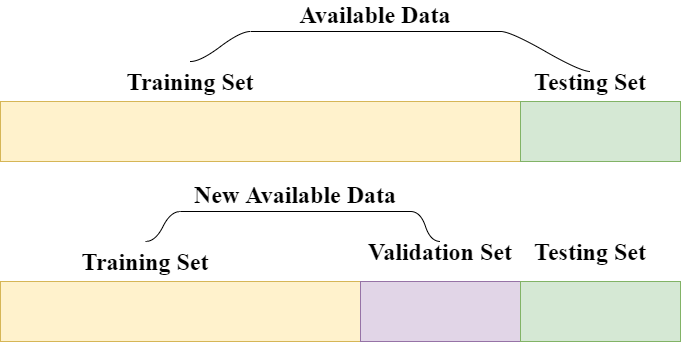

# Adding Image Path in Annotations

In [15]:
#Building dictionary for category
categ_mapping = {}
for categ_item in train_categ:
  categ_mapping[categ_item['id']] = categ_item['name']
print(categ_mapping)

{1: 'tops', 2: 'trousers', 3: 'outerwear', 4: 'dresses', 5: 'skirts'}


In [16]:
train_path_mapping = {}

for img_item in train_img:
  train_path_mapping[img_item['id']] = img_item['file_name']
print(train_path_mapping)

test_path_mapping ={}

for img_item in test_img:
  test_path_mapping[img_item['id']] = img_item['file_name']
print(test_path_mapping)

{10: '10.jpg', 1000: '1000.jpg', 10003: '10003.jpg', 10005: '10005.jpg', 1001: '1001.jpg', 10016: '10016.jpg', 10024: '10024.jpg', 10027: '10027.jpg', 10031: '10031.jpg', 10036: '10036.jpg', 10043: '10043.jpg', 10047: '10047.jpg', 10049: '10049.jpg', 10050: '10050.jpg', 10052: '10052.jpg', 10056: '10056.jpg', 10058: '10058.jpg', 10061: '10061.jpg', 10066: '10066.jpg', 1007: '1007.jpg', 10071: '10071.jpg', 10075: '10075.jpg', 10078: '10078.jpg', 10079: '10079.jpg', 1008: '1008.jpg', 10081: '10081.jpg', 10091: '10091.jpg', 10093: '10093.jpg', 10095: '10095.jpg', 10096: '10096.jpg', 10098: '10098.jpg', 10099: '10099.jpg', 1010: '1010.jpg', 10101: '10101.jpg', 10104: '10104.jpg', 10107: '10107.jpg', 10113: '10113.jpg', 10116: '10116.jpg', 10118: '10118.jpg', 10120: '10120.jpg', 10122: '10122.jpg', 10125: '10125.jpg', 10128: '10128.jpg', 10137: '10137.jpg', 10140: '10140.jpg', 10142: '10142.jpg', 10145: '10145.jpg', 1015: '1015.jpg', 10152: '10152.jpg', 10156: '10156.jpg', 10158: '10158.jpg

In [17]:
for annt in train_ann:
  annt['image_path'] = train_path_mapping[annt['image_id']]
  annt['cat'] = categ_mapping[annt['category_id']]

for annt in test_ann:
  annt['image_path'] = test_path_mapping[annt['image_id']]
  annt['cat'] = categ_mapping[annt['category_id']]

print(train_ann)
print(test_ann)

[{'area': 2304645, 'iscrowd': 0, 'id': 1, 'image_id': 10, 'category_id': 4, 'bbox': [704, 620, 1401, 1645], 'image_path': '10.jpg', 'cat': 'dresses'}, {'area': 55769, 'iscrowd': 0, 'id': 2, 'image_id': 1000, 'category_id': 1, 'bbox': [321, 332, 217, 257], 'image_path': '1000.jpg', 'cat': 'tops'}, {'area': 17108, 'iscrowd': 0, 'id': 3, 'image_id': 10003, 'category_id': 2, 'bbox': [220, 758, 188, 91], 'image_path': '10003.jpg', 'cat': 'trousers'}, {'area': 117909, 'iscrowd': 0, 'id': 4, 'image_id': 10003, 'category_id': 5, 'bbox': [150, 397, 297, 397], 'image_path': '10003.jpg', 'cat': 'skirts'}, {'area': 105925, 'iscrowd': 0, 'id': 5, 'image_id': 10003, 'category_id': 1, 'bbox': [85, 207, 475, 223], 'image_path': '10003.jpg', 'cat': 'tops'}, {'area': 3314505, 'iscrowd': 0, 'id': 6, 'image_id': 10005, 'category_id': 4, 'bbox': [1971, 2059, 1483, 2235], 'image_path': '10005.jpg', 'cat': 'dresses'}, {'area': 198360, 'iscrowd': 0, 'id': 7, 'image_id': 10005, 'category_id': 2, 'bbox': [1524,

# Resizing the Images

In [18]:
image_size = 224

In [19]:
def preprocess_image(image_path, desired_size=image_size):
    im = Image.open(image_path)
    im = im.resize((desired_size, )*2, resample=Image.LANCZOS)
    
    return im

In [20]:
#turing the dictionary into dataframe
path_df = pd.DataFrame(list(train_path_mapping.items()),columns = ['id','name']) 
print(path_df)

         id       name
0        10     10.jpg
1      1000   1000.jpg
2     10003  10003.jpg
3     10005  10005.jpg
4      1001   1001.jpg
...     ...        ...
8220   3163   3163.jpg
8221  11870  11870.jpg
8222  10864  10864.jpg
8223   6353   6353.jpg
8224  15656  15656.jpg

[8225 rows x 2 columns]


In [21]:
# getting the number of training images from the target\id dataset

N = path_df.shape[0]

# creating an empty matrix for storing the images
x_train = np.empty((N, image_size, image_size, 3), dtype=np.uint8)

# looping through the images from the images ids from the target\id dataset
# grabing the cooresponding image from disk, pre-process, and store in matrix in memory
for i, annotation in enumerate(tqdm(train_ann)):
    image_id = annotation['image_id']

100%|██████████| 13317/13317 [00:00<00:00, 663635.51it/s]
